In [1]:
import pandas as pd
import numpy as np
import os
import sys
import matplotlib.pyplot as plt
import glob
import seaborn as sns
from scipy.stats import norm, zscore
from sklearn.metrics.pairwise import cosine_similarity
from collections import defaultdict
import umap
import warnings
warnings.filterwarnings('ignore')

sys.path.append('../funcs')

import proteomics as prot
import processing as pp
import plotting as pl
from utils import get_pcs, remove_covariates, plot_pca, plot_pca_gridplot, plot_pca_ax
import nmf_utilities as nmu
import signatureanalyzer as sa

In [2]:
DATA_DIR = "../data/processed/061721"
NMF_FILE = "signatures/061721_imputed_res_reg/nmf_output.h5"
MAPPING_FILE = "../data/processed/061721/PanCan_Participant_freeze_mapping.tsv"
PLOTS_DIR = "figures/ardnmf/061721_imputed_res_reg"
RUN_NAME = NMF_FILE.split("/")[-2]

DIFF = 0.1
MAX_NORM = 0.25

os.makedirs(PLOTS_DIR, exist_ok=True)

## 1. Load ARD-NMF Results
---

In [3]:
X,H,W,signatures,markers = nmu.nmf_loader(NMF_FILE)

In [4]:
samples_df = pd.read_csv(MAPPING_FILE, sep='\t', index_col=0)
meta = samples_df.set_index('Proteome_Sample_ID')['cohort'].loc[X.columns]
meta.name = 'cohort'

pmap_df = pd.read_csv(os.path.join(DATA_DIR, "var_map_full.tsv"),sep='\t',index_col=0)

In [5]:
site_annot = X.reset_index()['index'].apply(prot.assign_ptm_type)
site_annot.index = X.index

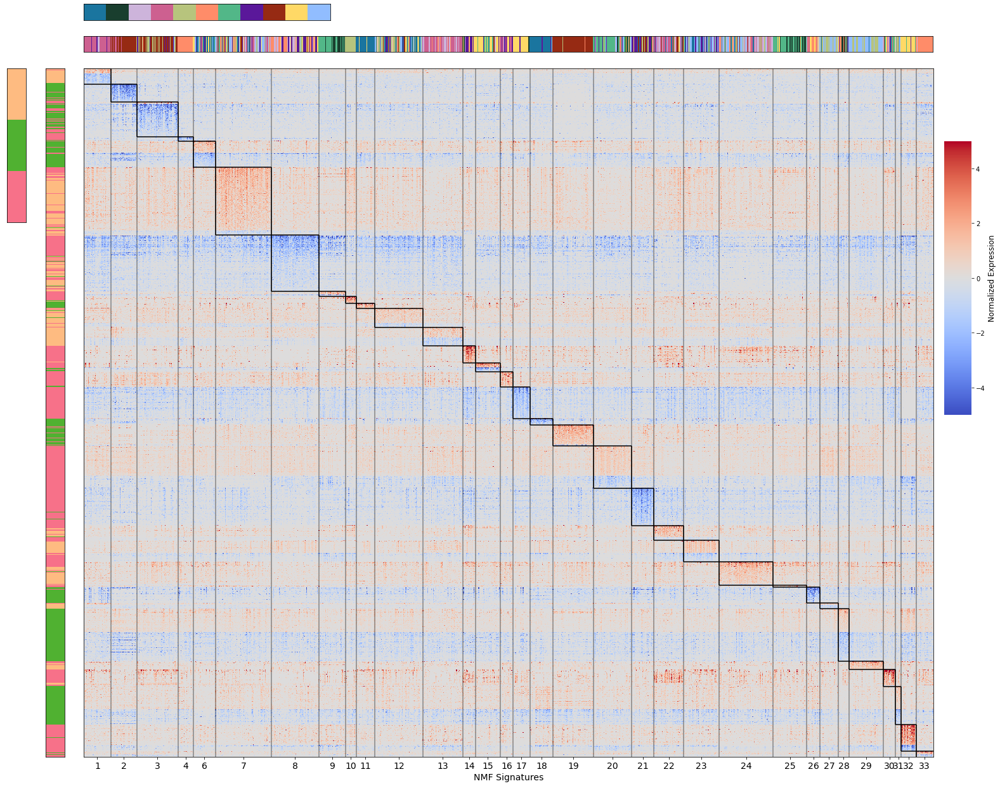

In [9]:
_ = pl.plot_proteomics_heatmap(
    X,
    signatures,
    H['max_id'].sort_values(),
    diff=DIFF,
    ptm=site_annot,
    max_norm=MAX_NORM,
    vmax=5,
    vmin=-5,
    cmap='coolwarm',
    cohort_s=meta,
    y_hm_label='Protein Abundance',
    figsize=(24,20)
)
plt.savefig(os.path.join(PLOTS_DIR, "ardnmf_marker_heatmap.pdf"), dpi=100, bbox_inches='tight')

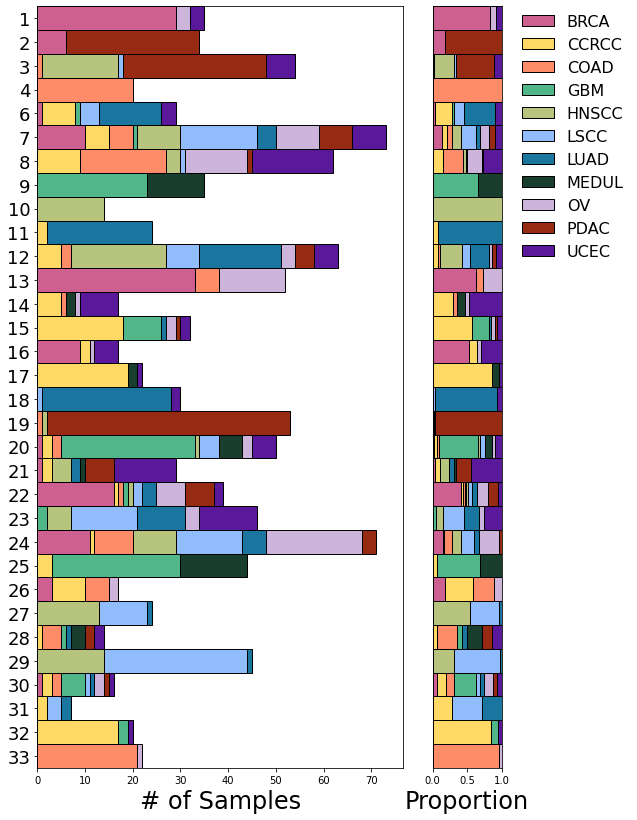

In [8]:
_ = pl.plot_sig_props(H, meta, signatures, figsize=(9,12))
plt.savefig(os.path.join(PLOTS_DIR, "signature_proportions_barplot.pdf"), dpi=100, bbox_inches='tight')

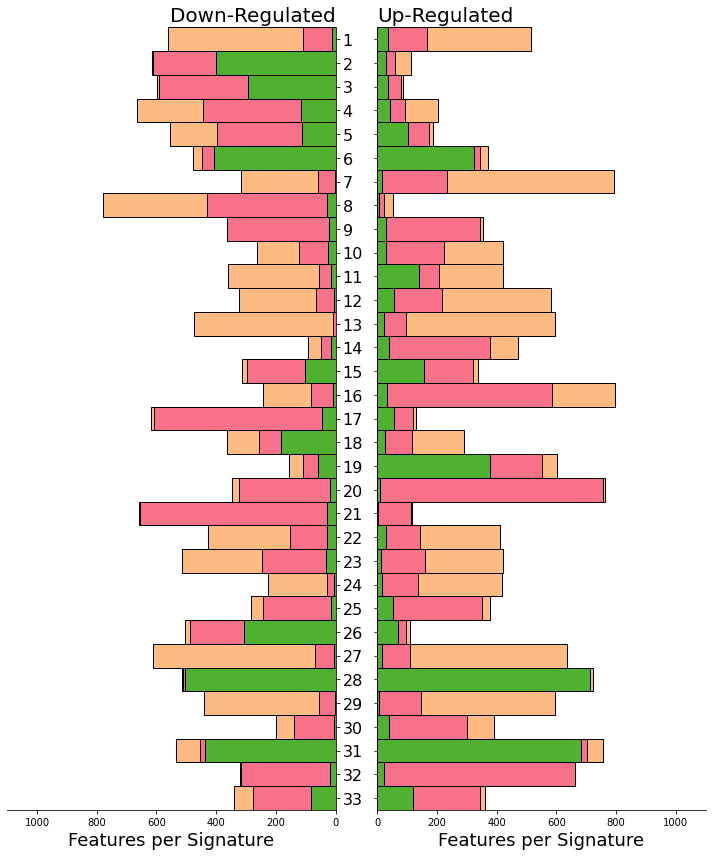

In [10]:
pl.plot_sig_W_props(W, pmap_df)
plt.savefig(os.path.join(PLOTS_DIR, "ptm_proportion_per_sig_v2.pdf"),dpi=100,bbox_inches='tight')

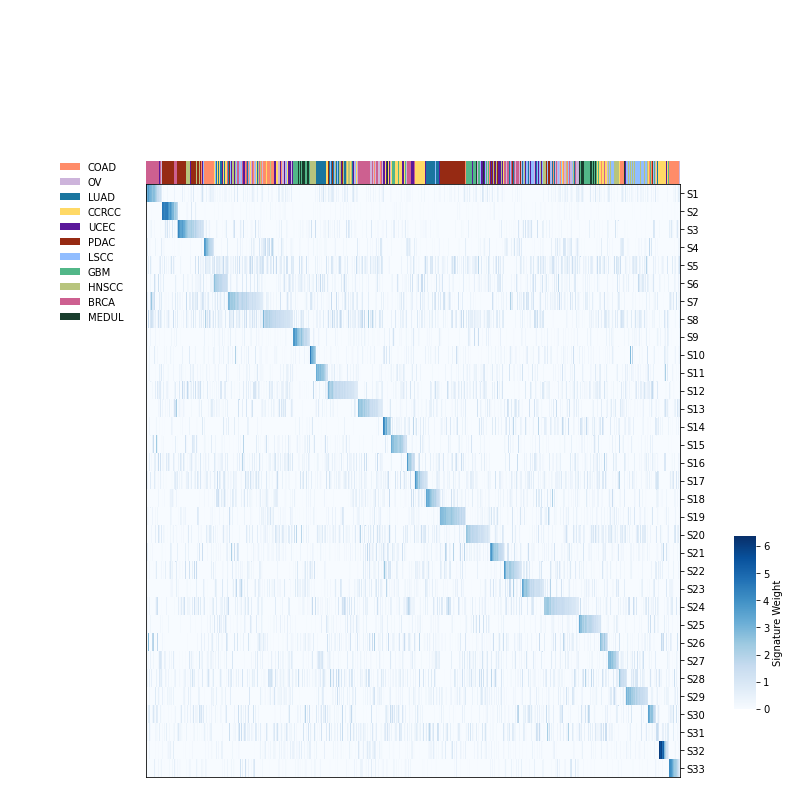

In [6]:
mappings_df = H[['max_id','max_norm']].join(meta)
order = mappings_df.sort_values(['max_id','max_norm'], ascending=[True,False]).index
pl.plot_signatures_heatmap(NMF_FILE, [meta,], order=order, figsize=(10,12))
plt.savefig(os.path.join(PLOTS_DIR, "H_mat_clustermap_sorted.pdf"),dpi=100,bbox_inches='tight')

In [19]:
mappings_df.to_csv(os.path.join(os.path.dirname(NMF_FILE), "mappings.tsv"), sep='\t')

## 2. UMAP Visualization of Samples & Signatures
---

In [6]:
X,H,W,signatures,markers = nmu.nmf_loader(NMF_FILE)
pan_reg_X = pd.read_parquet(os.path.join(DATA_DIR, "imputed_res/pan_reg_X.parquet"))
pan_X = pd.read_parquet(os.path.join(DATA_DIR, "imputed_res/pan_X.parquet"))

pan_reg_split_X = sa.utils.split_negatives(pan_reg_X)

In [9]:
pan_pdf_X, pan_pca_X, _ = prot.get_pca_umap(pan_X)
pan_reg_pdf_X, pan_reg_pca_X, _ = prot.get_pca_umap(pan_reg_X)
pan_reg_split_pdf_X, pan_reg_split_pca_X, _ = prot.get_pca_umap(pan_reg_split_X)

pan_pdf_rna_X, pan_pca_rna_X, _ = prot.get_pca_umap(pan_X.loc[pan_X.index.str.startswith("ENSG"),:])
pan_reg_pdf_rna_X, pan_reg_pca_rna_X, _ = prot.get_pca_umap(pan_reg_X.loc[pan_reg_X.index.str.startswith("ENSG"),:])
pan_reg_split_pdf_rna_X, pan_reg_split_pca_rna_X, pan_reg_split_feats_rna_X = prot.get_pca_umap(pan_reg_split_X.loc[pan_reg_split_X.index.str.startswith("ENSG"),:])

pan_pdf_prot_X, pan_pca_prot_X, _ = prot.get_pca_umap(pan_X.loc[~pan_X.index.str.startswith("ENSG"),:])
pan_reg_pdf_prot_X, pan_reg_pca_prot_X, _ = prot.get_pca_umap(pan_reg_X.loc[~pan_reg_X.index.str.startswith("ENSG"),:])
pan_reg_split_pdf_prot_X, pan_reg_split_pca_prot_X, _ = prot.get_pca_umap(pan_reg_split_X.loc[~pan_reg_split_X.index.str.startswith("ENSG"),:])

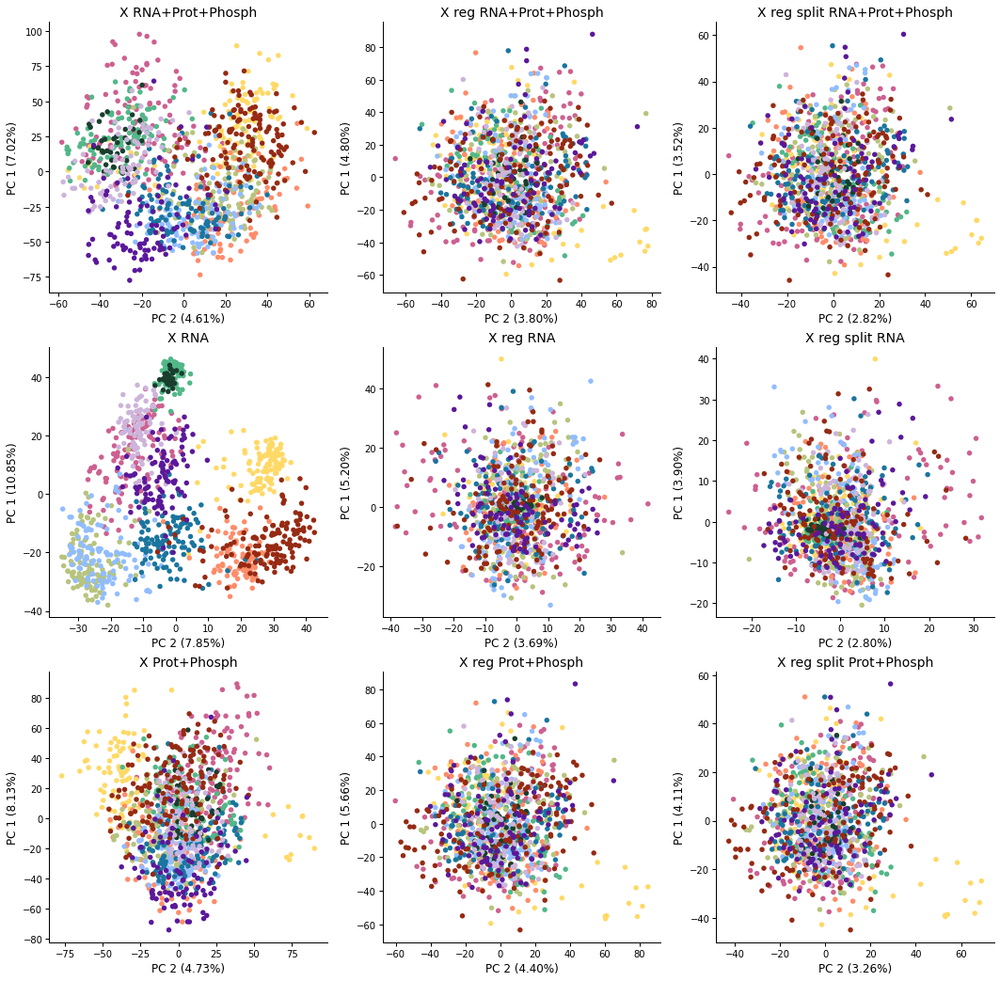

In [87]:
fig, axes = plt.subplots(3,3, figsize=(18,18))

_ = plot_pca_ax(pan_pdf_X, pan_pca_X, cohort_s=meta, cohort_colors=pl.CPTAC_CMAP, ax=axes[0,0])
_ = plot_pca_ax(pan_pdf_rna_X, pan_pca_rna_X, cohort_s=meta, cohort_colors=pl.CPTAC_CMAP, ax=axes[1,0])
_ = plot_pca_ax(pan_pdf_prot_X, pan_pca_prot_X, cohort_s=meta, cohort_colors=pl.CPTAC_CMAP, ax=axes[2,0])

_ = plot_pca_ax(pan_reg_pdf_X, pan_reg_pca_X, cohort_s=meta, cohort_colors=pl.CPTAC_CMAP, ax=axes[0,1])
_ = plot_pca_ax(pan_reg_pdf_rna_X, pan_reg_pca_rna_X, cohort_s=meta, cohort_colors=pl.CPTAC_CMAP, ax=axes[1,1])
_ = plot_pca_ax(pan_reg_pdf_prot_X, pan_reg_pca_prot_X, cohort_s=meta, cohort_colors=pl.CPTAC_CMAP, ax=axes[2,1])

_ = plot_pca_ax(pan_reg_split_pdf_X, pan_reg_split_pca_X, cohort_s=meta, cohort_colors=pl.CPTAC_CMAP, ax=axes[0,2])
_ = plot_pca_ax(pan_reg_split_pdf_rna_X, pan_reg_split_pca_rna_X, cohort_s=meta, cohort_colors=pl.CPTAC_CMAP, ax=axes[1,2])
_ = plot_pca_ax(pan_reg_split_pdf_prot_X, pan_reg_split_pca_prot_X, cohort_s=meta, cohort_colors=pl.CPTAC_CMAP, ax=axes[2,2])


axes[0,0].set_title("X RNA+Prot+Phosph", fontsize=14)
axes[1,0].set_title("X RNA", fontsize=14)
axes[2,0].set_title("X Prot+Phosph", fontsize=14)
axes[0,1].set_title("X reg RNA+Prot+Phosph", fontsize=14)
axes[1,1].set_title("X reg RNA", fontsize=14)
axes[2,1].set_title("X reg Prot+Phosph", fontsize=14)
axes[0,2].set_title("X reg split RNA+Prot+Phosph", fontsize=14)
axes[1,2].set_title("X reg split RNA", fontsize=14)
axes[2,2].set_title("X reg split Prot+Phosph", fontsize=14)

axes[0,0].legend().remove()
axes[0,1].legend().remove()
axes[0,2].legend().remove()
axes[1,0].legend().remove()
axes[1,1].legend().remove()
axes[1,2].legend().remove()
axes[2,0].legend().remove()
axes[2,1].legend().remove()
axes[2,2].legend().remove()
plt.savefig(os.path.join(PLOTS_DIR, "pca_featurespace_grids.pdf"), dpi=300, bbox_inches='tight')

In [83]:
# Compute UMAP for H
fit = umap.UMAP(metric='cosine', spread=1, n_neighbors=30)
H_umap = fit.fit_transform(H.iloc[:,:-3])
H['umap1'] = H_umap[:,0]
H['umap2'] = H_umap[:,1]

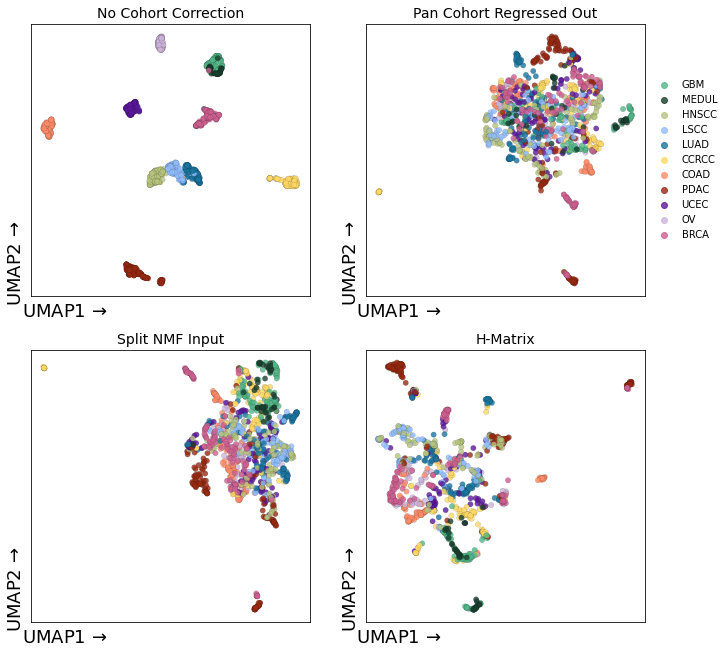

In [84]:
fig, axes = plt.subplots(2,2, figsize=(11,11))

_ = pl.plot_umap(
    pan_pdf_X, 
    meta, 
    s=30, 
    cdict=pl.CPTAC_CMAP, 
    figsize=(5,5), 
    loc='center left', 
    bbox_to_anchor=(1, 0.5),
    frameon=False,
    ax=axes[0,0]
)

_ = pl.plot_umap(
    pan_reg_pdf_X, 
    meta, 
    s=30, 
    cdict=pl.CPTAC_CMAP, 
    figsize=(5,5), 
    loc='center left', 
    bbox_to_anchor=(1, 0.5),
    frameon=False,
    ax=axes[0,1]
)
_ = pl.plot_umap(
    pan_reg_split_pdf_X, 
    meta, 
    s=30, 
    cdict=pl.CPTAC_CMAP, 
    figsize=(5,5), 
    loc='center left', 
    bbox_to_anchor=(1, 0.5),
    frameon=False,
    ax=axes[1,0]
)

_ = pl.plot_umap(
    H, 
    meta, 
    s=30, 
    cdict=pl.CPTAC_CMAP, 
    figsize=(5,5), 
    loc='center left', 
    bbox_to_anchor=(1, 0.5),
    frameon=False,
    ax=axes[1,1]
)

axes[0,0].set_title("No Cohort Correction", fontsize=14)
axes[0,1].set_title("Pan Cohort Regressed Out", fontsize=14)
axes[1,0].set_title("Split NMF Input", fontsize=14)
axes[1,1].set_title("H-Matrix", fontsize=14)

axes[0,0].legend().remove()
axes[1,0].legend().remove()
axes[1,1].legend().remove()
plt.savefig(os.path.join(PLOTS_DIR, "umap_2b2_grid.pdf"), dpi=100, bbox_inches='tight')

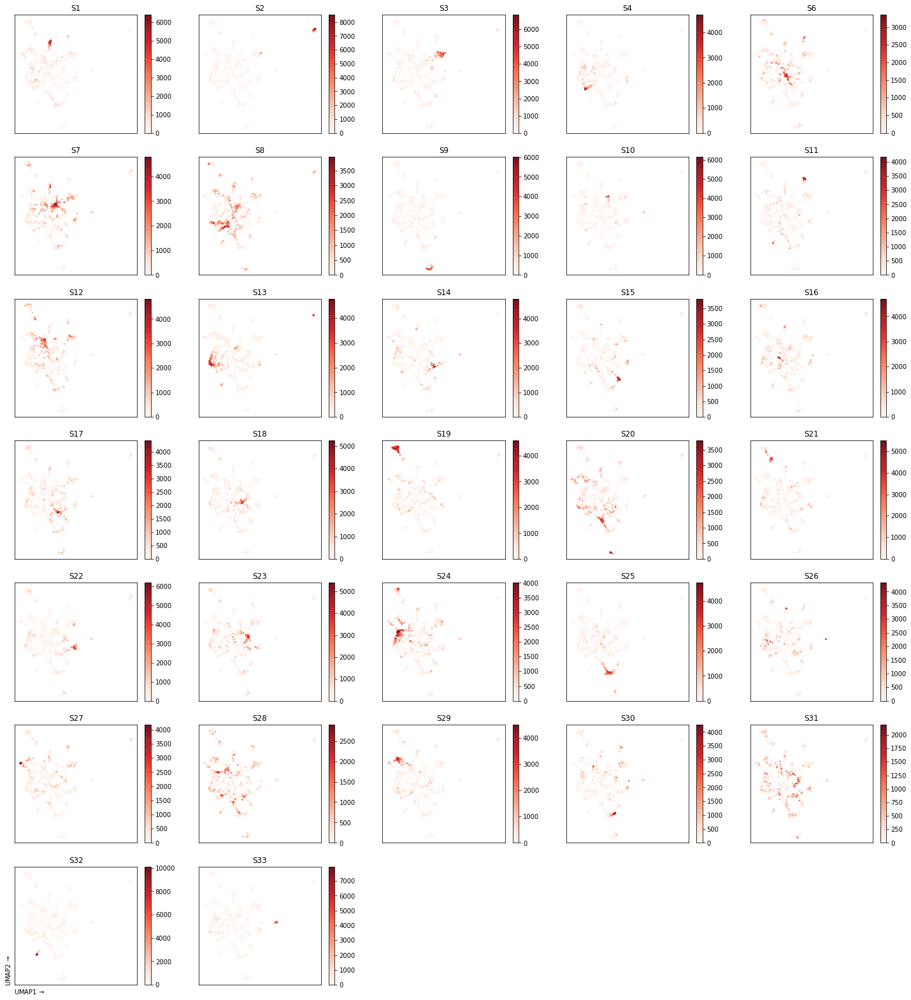

In [85]:
_ = pl.plot_umap_sigs(H, H[['umap1','umap2']].values, ncols=5)
#plt.savefig(os.path.join(PLOTS_DIR, "umap_signature_grid.pdf"), dpi=100, bbox_inches='tight')

In [57]:
W = prot.process_Wmat(NMF_FILE, pmap_df)
W.to_csv(os.path.join(os.path.dirname(NMF_FILE), "W_processed.tsv"), sep='\t')

In [17]:
prot.gen_phospho_wmat_ptmgsea(
    os.path.join(os.path.dirname(NMF_FILE), "W_processed.tsv"),
    pmap_df,
    "signatures/061721_imputed_res_reg/Wmat_phosph_ptmgsea.gct"
)

## 3. Sample-Sample Heirarchical Clustering
---

In [3]:
# H raw
Hraw = pd.read_hdf(NMF_FILE, "Hraw").T

# H raw
corr_raw_mat = pd.DataFrame(cosine_similarity(Hraw), index=Hraw.index, columns=Hraw.index)
corr_raw_mat.to_csv(os.path.join(os.path.dirname(NMF_FILE), "cosine_sim_H.tsv"), sep='\t')

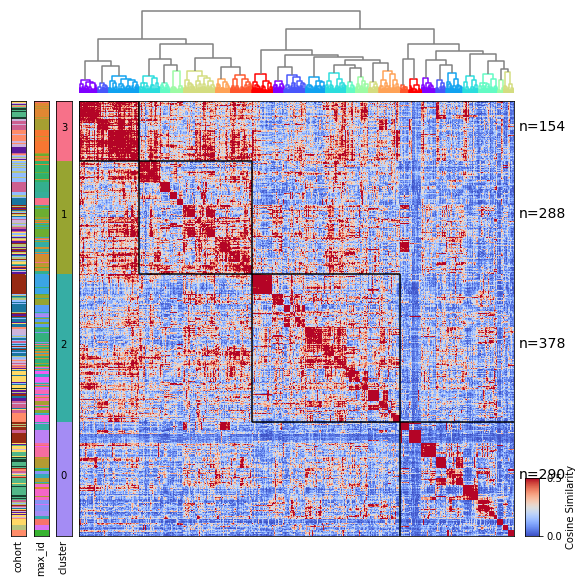

In [9]:
N_CLUSTERS = 4

f,d,dres,d_linkage = pl.plot_cmatrix(
    corr_raw_mat, 
    n_clusters=N_CLUSTERS, 
    metas=['aggr', H.max_id.astype(str), meta],
    vmax=0.5,
    cbar_label='Cosine Similarity',
    metric='euclidean',
    method='ward',
    cmap='coolwarm',
    plot_cluster_lines=True,
    show_xlab=False
)

plt.savefig(os.path.join(PLOTS_DIR, "sample_sample_H_map.pdf"),dpi=100,bbox_inches='tight')

## 3.1 Determining Number of Clusters
---

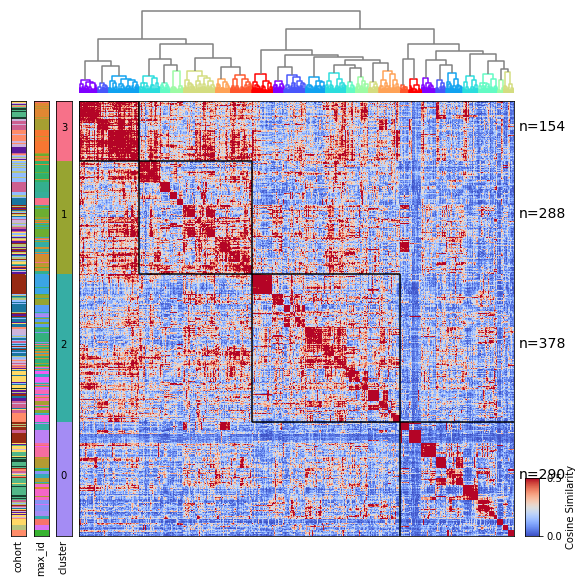

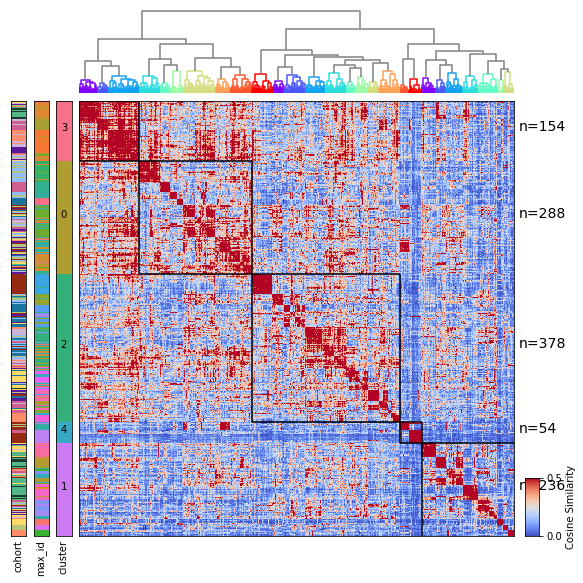

In [209]:
for k in [4,5]:
    f,d,dres,d_linkage = pl.plot_cmatrix(
        corr_raw_mat, 
        n_clusters=k, 
        metas=['aggr', H.max_id.astype(str), meta],
        vmax=0.5,
        cbar_label='Cosine Similarity',
        metric='euclidean',
        method='ward',
        cmap='coolwarm',
        plot_cluster_lines=True,
        show_xlab=False
    )
    plt.savefig(os.path.join(PLOTS_DIR, 'cmap_clustermap_c{}.pdf'.format(str(k))), dpi=200, bbox_inches='tight')

In [124]:
from typing import Union

In [214]:
def cluster_cmatrix(
    X: pd.DataFrame,
    H: pd.DataFrame,
    metric: str = 'euclidean',
    method: str = 'ward',
    range_n_clusters: list = [2,3],
    p: int = 30,
    xlim: float = 0.3
    ):
    """Cluster matrix."""
    from scipy.cluster import hierarchy
    import scipy.cluster.hierarchy as shc
    from sklearn.cluster import AgglomerativeClustering
    from sklearn.metrics import silhouette_samples, silhouette_score, calinski_harabasz_score
    import matplotlib.cm as cm
    from sklearn.metrics import davies_bouldin_score
    
    if metric=='precomputed':
        method='average'
        d_linkage =shc.linkage(shc.distance.squareform(1-X.values), method=method)
    else:
        d_linkage = shc.linkage(X, metric=metric, method=method)
        
    dres = shc.dendrogram(d_linkage, p=p, no_plot=True)
    dgram_idx = list(map(int, dres['ivl']))

    fig, axes = plt.subplots(len(range_n_clusters), 2, figsize=(8,4*len(range_n_clusters)), sharex=True)
    resd = dict()
    ch_d = dict()
    
    for idx,n_clusters in enumerate(range_n_clusters):
        # Agglomerative Clustering
        cluster = AgglomerativeClustering(
            n_clusters=n_clusters,
            affinity=metric,
            linkage=method
        )                        
        clusters = cluster.fit_predict(X.iloc[dgram_idx,:])
        
        # Silhouette
        silhouette_avg = silhouette_score(
                X.iloc[dgram_idx,:], 
                clusters
            )
        silhouette_avg_h = silhouette_score(
            H.iloc[dgram_idx,:], 
            clusters, metric='cosine'
        )
        
        # CH Score
        ch_avg = calinski_harabasz_score(
                X.iloc[dgram_idx,:], 
                clusters
            )
        ch_avg_h = calinski_harabasz_score(
            H.iloc[dgram_idx,:], 
            clusters, 
        )
        
        _ch_d = dict()
        _ch_d['sim'] = ch_avg
        _ch_d['h'] = ch_avg_h
        ch_d[n_clusters] = _ch_d
                                 
        print(
            "For n_clusters =",
            n_clusters,
            "The average silhouette_score is :",
            silhouette_avg, " - ", silhouette_avg_h
        )
        
        rs = pd.DataFrame(clusters, index=X.index[dgram_idx]).rename(columns={0:'clusters'})
        
        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(X.iloc[dgram_idx,:], clusters)
        sample_silhouette_values_h = silhouette_samples(H.iloc[dgram_idx,:], clusters, metric='cosine')
        rs['silhouette_sim'] = sample_silhouette_values
        rs['silhouette_h'] = sample_silhouette_values_h
        rs['n_clust'] = n_clusters
        resd[n_clusters] = rs

        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = sample_silhouette_values[clusters == i]
            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            axes[idx,0].fill_betweenx(
                np.arange(y_lower, y_upper),
                0,
                ith_cluster_silhouette_values,
                facecolor=color,
                edgecolor=color,
                alpha=0.7,
            )

            # Label the silhouette plots with their cluster numbers at the middle
            axes[idx,0].text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples
            
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = sample_silhouette_values_h[clusters == i]
            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            axes[idx,1].fill_betweenx(
                np.arange(y_lower, y_upper),
                0,
                ith_cluster_silhouette_values,
                facecolor=color,
                edgecolor=color,
                alpha=0.7,
            )

            # Label the silhouette plots with their cluster numbers at the middle
            axes[idx,1].text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples
        
        axes[idx,0].set_ylabel("Cluster Label", fontsize=14)

        # The vertical line for average silhouette score of all the values
        axes[idx,0].axvline(x=silhouette_avg, color="red", linestyle=":")
        axes[idx,1].axvline(x=silhouette_avg_h, color="red", linestyle=":")

        axes[idx,0].set_yticks([])  # Clear the yaxis labels / ticks
        axes[idx,1].set_yticks([])  # Clear the yaxis labels / ticks
        
        axes[idx,0].set_xlim([-0.1, xlim])
        axes[idx,1].set_xlim([-0.1, xlim])

    axes[0,0].set_title("Similarity Matrix", fontsize=16)
    axes[0,1].set_title("H Matrix", fontsize=16)
    axes[idx,0].set_xlabel("Silhouette Coefficient", fontsize=14)
    axes[idx,1].set_xlabel("Silhouette Coefficient", fontsize=14)
    
    plt.tight_layout()
    return resd, ch_d

For n_clusters = 2 The average silhouette_score is : 0.07896531  -  0.063210905
For n_clusters = 3 The average silhouette_score is : 0.065583825  -  0.068056524
For n_clusters = 4 The average silhouette_score is : 0.055260688  -  0.036656883
For n_clusters = 5 The average silhouette_score is : 0.060922455  -  0.058312822
For n_clusters = 6 The average silhouette_score is : 0.06768182  -  0.063745335
For n_clusters = 7 The average silhouette_score is : 0.07564963  -  0.08028013
For n_clusters = 8 The average silhouette_score is : 0.080873005  -  0.095196754
For n_clusters = 9 The average silhouette_score is : 0.08958447  -  0.11459194
For n_clusters = 10 The average silhouette_score is : 0.09542577  -  0.12730843


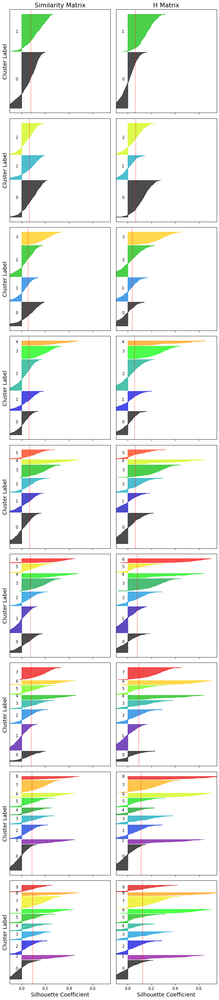

In [215]:
resd, ch_d = cluster_cmatrix(corr_raw_mat, Hraw, range_n_clusters=[2,3,4,5,6,7,8,9,10], xlim=0.75)

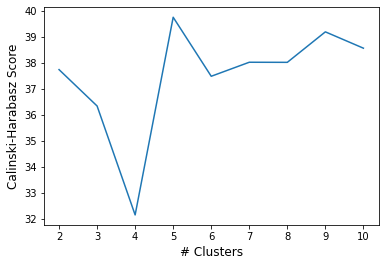

In [225]:
_df = pd.DataFrame.from_dict(ch_d).T.reset_index()

resd_full = pd.concat([x for x in resd.values()],0)
fig, ax = plt.subplots(figsize=(6,4))

#sns.lineplot(data=_df, x='index',y='sim', ax=ax, label='Similarity Matrix')
sns.lineplot(data=_df, x='index',y='h', ax=ax)

ax.set_ylabel("Calinski-Harabasz Score", fontsize=12)
ax.set_xlabel("# Clusters", fontsize=12)
plt.savefig(os.path.join(PLOTS_DIR, "ch_score_n10.pdf"), dpi=200, bbox_inches='tight')

For n_clusters = 2 The average silhouette_score is : 0.063210905  -  0.07896531
For n_clusters = 3 The average silhouette_score is : 0.068056524  -  0.065583825
For n_clusters = 4 The average silhouette_score is : 0.036656883  -  0.055260688
For n_clusters = 5 The average silhouette_score is : 0.058312822  -  0.060922455
For n_clusters = 6 The average silhouette_score is : 0.063745335  -  0.06768182
For n_clusters = 7 The average silhouette_score is : 0.08028013  -  0.07564963
For n_clusters = 8 The average silhouette_score is : 0.095196754  -  0.080873005
For n_clusters = 9 The average silhouette_score is : 0.11459194  -  0.08958447
For n_clusters = 10 The average silhouette_score is : 0.12730843  -  0.09542577


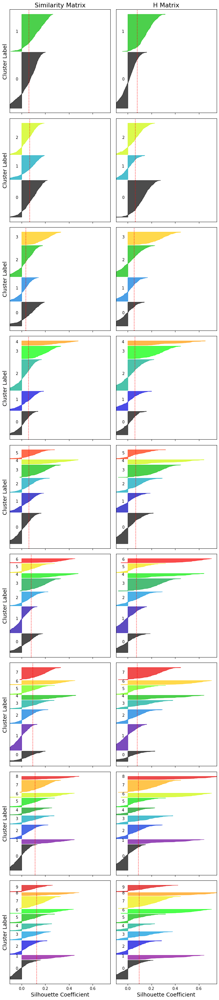

In [208]:
resd = cluster_cmatrix(corr_raw_mat, Hraw, range_n_clusters=[2,3,4,5,6,7,8,9,10], xlim=0.75)
plt.savefig(os.path.join(PLOTS_DIR, 'silhouttee_by_sample.pdf'), dpi=200, bbox_inches='tight')

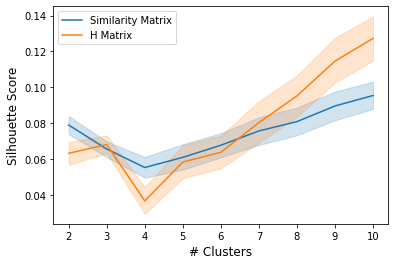

In [204]:
resd_full = pd.concat([x for x in resd.values()],0)
fig, ax = plt.subplots(figsize=(6,4))

sns.lineplot(data=resd_full, x='n_clust',y='silhouette_sim', ax=ax, label='Similarity Matrix')
sns.lineplot(data=resd_full, x='n_clust',y='silhouette_h', ax=ax, label='H Matrix')

ax.set_ylabel("Silhouette Score", fontsize=12)
ax.set_xlabel("# Clusters", fontsize=12)
plt.savefig(os.path.join(PLOTS_DIR, "silhouette_score_n10.pdf"), dpi=200, bbox_inches='tight')

For n_clusters = 2 The average silhouette_score is : 0.063210905  -  0.07896531
For n_clusters = 3 The average silhouette_score is : 0.068056524  -  0.065583825
For n_clusters = 4 The average silhouette_score is : 0.036656883  -  0.055260688
For n_clusters = 5 The average silhouette_score is : 0.058312822  -  0.060922455
For n_clusters = 6 The average silhouette_score is : 0.063745335  -  0.06768182
For n_clusters = 7 The average silhouette_score is : 0.08028013  -  0.07564963
For n_clusters = 8 The average silhouette_score is : 0.095196754  -  0.080873005
For n_clusters = 9 The average silhouette_score is : 0.11459194  -  0.08958447
For n_clusters = 10 The average silhouette_score is : 0.12730843  -  0.09542577
For n_clusters = 11 The average silhouette_score is : 0.11891863  -  0.09399497
For n_clusters = 12 The average silhouette_score is : 0.1193027  -  0.09459597
For n_clusters = 13 The average silhouette_score is : 0.12172458  -  0.09771393
For n_clusters = 14 The average silhoue

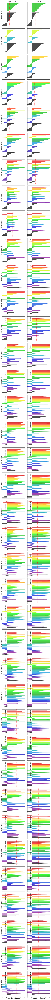

In [198]:
resd = cluster_cmatrix(corr_raw_mat, Hraw, range_n_clusters=np.arange(2,40), xlim=0.4)

In [199]:
resd_full = pd.concat([x for x in resd.values()],0)

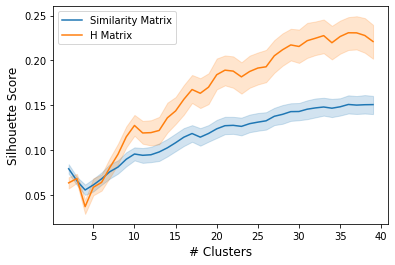

In [202]:
fig, ax = plt.subplots(figsize=(6,4))

sns.lineplot(data=resd_full, x='n_clust',y='silhouette_sim', ax=ax, label='Similarity Matrix')
sns.lineplot(data=resd_full, x='n_clust',y='silhouette_h', ax=ax, label='H Matrix')

ax.set_ylabel("Silhouette Score", fontsize=12)
ax.set_xlabel("# Clusters", fontsize=12)
plt.savefig(os.path.join(PLOTS_DIR, "silhouette_score_n4.pdf"), dpi=200, bbox_inches='tight')

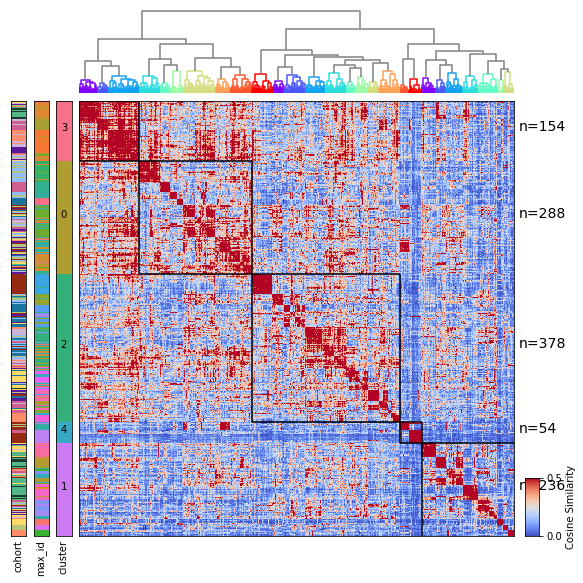

In [12]:
f,d,dres,d_linkage = pl.plot_cmatrix(
    corr_raw_mat, 
    n_clusters=5, 
    metas=['aggr', H.max_id.astype(str), meta],
    vmax=0.5,
    cbar_label='Cosine Similarity',
    metric='euclidean',
    method='ward',
    cmap='coolwarm',
    plot_cluster_lines=True,
    show_xlab=False
)

In [14]:
rename_split1 = {
    3:"C1",
    0:"C2",
    2:"C3",
    4:"C4",
    1:"C5"
}

d['PanCan_clusters'] = d['clusters'].apply(lambda x: rename_split1[x])

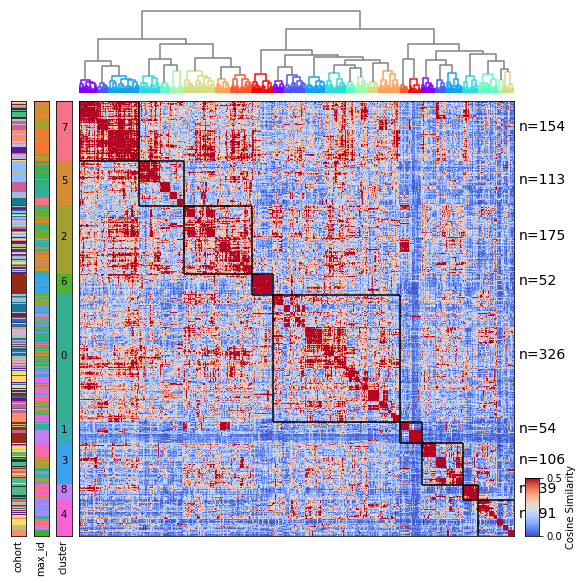

In [16]:
f,d2,dres,d_linkage = pl.plot_cmatrix(
    corr_raw_mat, 
    n_clusters=9, 
    metas=['aggr', H.max_id.astype(str), meta],
    vmax=0.5,
    cbar_label='Cosine Similarity',
    metric='euclidean',
    method='ward',
    cmap='coolwarm',
    plot_cluster_lines=True,
    show_xlab=False
)

In [17]:
rename_split2 = {
    7:"C1",
    5:"C2a",
    2:"C2b",
    6:"C3a",
    0:"C3b",
    1:"C4",
    3:"C5a",
    8:"C5b",
    4:"C5c",
}

d2['PanCan_clusters_detailed'] = d2['clusters'].apply(lambda x: rename_split2[x])

In [22]:
pancan_clusters_df = d.join(d2.iloc[:,1:]).iloc[:,1:]

In [27]:
pancan_clusters_df.groupby(["PanCan_clusters","PanCan_clusters_detailed"]).size()

PanCan_clusters  PanCan_clusters_detailed
C1               C1                          154
C2               C2a                         113
                 C2b                         175
C3               C3a                          52
                 C3b                         326
C4               C4                           54
C5               C5a                         106
                 C5b                          39
                 C5c                          91
dtype: int64

In [35]:
pancan_clusters_df = pancan_clusters_df.join(
    pd.read_csv(os.path.join(os.path.dirname(NMF_FILE), "mappings.tsv"),sep='\t',index_col=0))

In [37]:
# Final Cluster Names
pancan_clusters_df.to_csv(os.path.join(os.path.dirname(NMF_FILE), "mappings_pancan_102322.tsv"), sep='\t')

---

In [100]:
C = prot.ss_linkage_cut(corr_raw_mat)

In [101]:
groups_df = prot.ss_linkage_groups(C)

  * 40 group comparisons


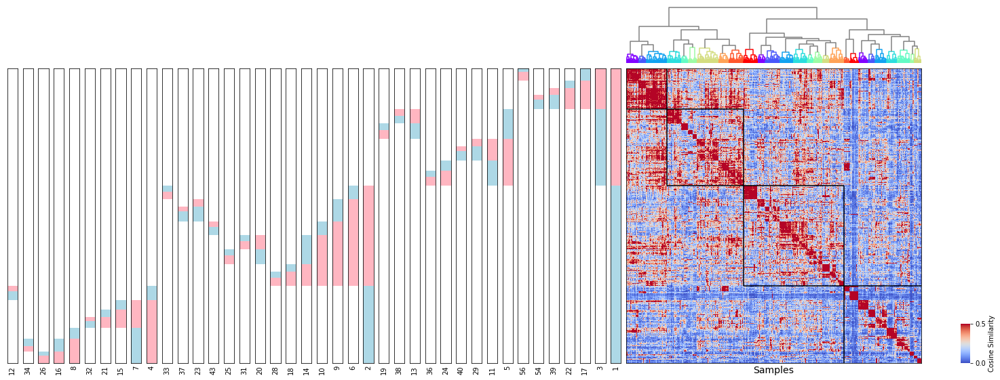

In [75]:
f,d,dres,d_linkage = pl.plot_cmatrix(
    corr_raw_mat, 
    n_clusters=N_CLUSTERS, 
    metas=[groups_df.fillna(-1)[x] for x in groups_df.columns],
    vmax=0.5,
    cbar_label='Cosine Similarity',
    metric='euclidean',
    method='ward',
    cmap='coolwarm',
    plot_cluster_lines=True,
    cdict_force={True:'lightpink', False:'lightblue', -1:'white'}
)

plt.savefig(os.path.join(PLOTS_DIR, "sample_sample_H_map_degroups.pdf"),dpi=100,bbox_inches='tight')

In [95]:
','.join([str(x) for x in groups_df.columns[::-1]])

'12,34,26,16,8,32,21,15,7,4,33,37,23,43,25,31,20,28,18,14,10,9,6,2,19,38,13,36,24,40,29,11,5,56,54,39,22,17,3,1'

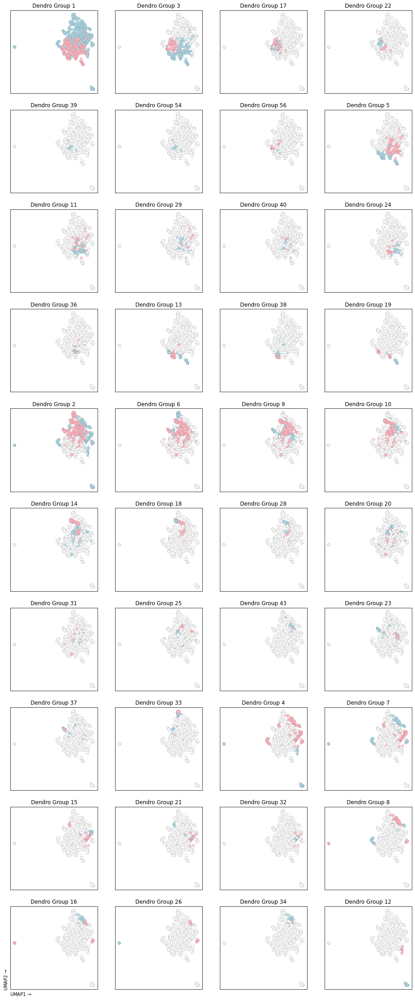

In [76]:
_ = pl.plot_dendro_umap_grid(pan_reg_pdf_X, groups_df)

plt.savefig(os.path.join(PLOTS_DIR, "umap_dendro_grid.pdf"), dpi=100, bbox_inches='tight')

In [82]:
os.makedirs(os.path.join("diffexp", RUN_NAME+"_dendro"), exist_ok=True)

In [104]:
groups_df.loc[d.index].to_csv(os.path.join("diffexp", RUN_NAME+"_dendro", "mappings.tsv"), sep='\t')
groups_df.loc[d.index].join(mappings_df).to_csv(os.path.join("diffexp", RUN_NAME+"_dendro", "full_dendro_sig_mappings.tsv"), sep='\t')

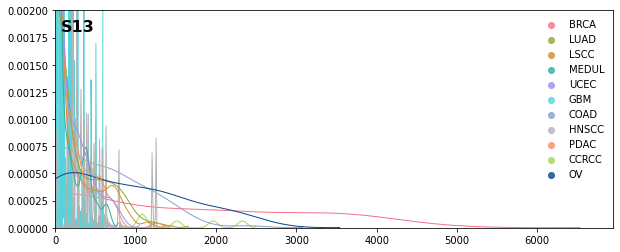

In [89]:
for s in ['S13']:
    pl.plot_signature_dist(H[s], meta, title=s, ylim=(0,.002))

## 4. Run Differential Expression & PTM-GSEA
---

* on W-matrix weights to annotate signatures
* on dendro-groups to find sample-sample clustering pathways


* Run `../scripts/run_diffexp.py`
* Run `../scripts/run_ptmgsea.sh`

## Move to Future Notebook

---

In [396]:
def collapse_pathway_df(enrichment_file):
    """
    Collapse pathways to dataframe.
    """
    W_gsea = pd.read_csv(enrichment_file, sep='\t', escapechar='\\')
    res = dict()

    for i in np.unique(W_gsea['id']):
        res[i] = dict()

        for assay in ('transcriptome','proteome','phosphoproteome'):
            dn = W_gsea[
                (W_gsea['id']==i) & 
                (W_gsea['feature']==assay) & 
                (W_gsea['padj']<0.1) &
                (W_gsea['NES']<0)
            ]['pathway'].values

            up = W_gsea[
                (W_gsea['id']==i) & 
                (W_gsea['feature']==assay) & 
                (W_gsea['padj']<0.1) &
                (W_gsea['NES']>0)
            ]['pathway'].values
            
            if dn.shape[0]>0: 
                res[i]["{}_down".format(assay.capitalize())] = dn
            else:
                res[i]["{}_down".format(assay.capitalize())] = None     

            if up.shape[0]>0: 
                res[i]["{}_up".format(assay.capitalize())] = up
            else:
                res[i]["{}_up".format(assay.capitalize())] = None
                
    res = pd.DataFrame.from_dict(res).T
    res.index.name = 'max_id'
    return res

def get_Wmat_assay_prop(W):
    """Get assay proportions."""
    df = W[['max_id','max','max_norm']]
    df['n'] = [-1 if x else 1 for x in df.index.str.endswith('_n')]
    df['max'] = df['max']*df['n']
    df['max_norm'] = df['max_norm']*df['n']
    df.index = df.index.str.replace('_n','')
    df = df.join(pmap_df[['geneSymbol','feature']])
    df['qval'] = 0
    df['feature'] = df['feature'].str.capitalize()
    
    # Pivot
    W_feat_down = pl.pivot_props(df[df['n']==-1], norm=True, x='feature',y='max_id')
    W_feat_up = pl.pivot_props(df[df['n']==1], norm=True, x='feature',y='max_id')
    
    W_feat_down.columns = [x+"_Wprop_down" for x in W_feat_down.columns]
    W_feat_up.columns = [x+"_Wprop_up" for x in W_feat_up.columns]
    
    return W_feat_up.join(W_feat_down)

def wmat_sig_summary(H, W, enrich_file, meta):
    """
    ARD NMF signature summary.
    """
    _size = H.groupby('max_id').size()
    _size.name = "n"

    return pl.pivot_props(H.join(meta), x='cohort', y='max_id').join(_size).join(
        get_Wmat_assay_prop(W)
    ).join(
        collapse_pathway_df(enrich_file)
    )

def wmat_ptmgsea_summary(filepath):
    """
    W-matrix PTM-GSEA summary.
    """
    phosph_df = pd.read_csv(filepath, sep='\t', index_col=0)
    phosph_df = phosph_df[phosph_df['fdr.pvalue']<0.1]
    
    res = dict()
    
    for idx in np.unique(phosph_df['id']):
        res[idx] = dict()
        
        up = phosph_df[(phosph_df['id']==idx) & (phosph_df['NES']>0)]['pathway'].values
        down = phosph_df[(phosph_df['id']==idx) & (phosph_df['NES']<0)]['pathway'].values
        
        if up.shape[0] > 0:
            res[idx]['ptmGSEA up'] = up
        else:
            res[idx]['ptmGSEA up'] = None
            
        if down.shape[0] > 0:
            res[idx]['ptmGSEA down'] = down
        else:
            res[idx]['ptmGSEA down'] = None            
        
    res = pd.DataFrame.from_dict(res).T
    res.index = [int(x[1:]) for x in res.index]
    return res

In [397]:
wmat_summary = wmat_sig_summary(H, W, "signatures/050721_imputed_res_reg/W_fgsea.tsv", meta)
wmat_summary.to_csv("signatures/050721_imputed_res_reg/W_sig_summary.tsv", sep='\t')

In [400]:
wmat_ptmgsea = wmat_ptmgsea_summary("diffexp/050721_imputed_res_reg/ptmgsea_wmat/phosph_de_full.tsv")
wmat_summary.join(wmat_ptmgsea)[wmat_ptmgsea.columns].to_csv("signatures/050721_imputed_res_reg/W_ptmgsea_summary.tsv", sep='\t')

#### Acetylome Combined

In [373]:
full_dendro_acetyl_de_cohort = pd.concat([load_de(x) for x in glob.glob("diffexp/050721_imputed_res_reg_dendro/*cohort_cov/acetylome*")])
full_dendro_acetyl_de_cohort = full_dendro_acetyl_de_cohort.set_index("index").join(pmap_df[['id.description','geneSymbol','accession_number','feature','variableSites']]).drop(columns=['level_0','gene_name'])

full_dendro_acetyl_de_no_covar = pd.concat([load_de(x) for x in glob.glob("diffexp/050721_imputed_res_reg_dendro/*_no_covar/acetylome*")])
full_dendro_acetyl_de_no_covar = full_dendro_acetyl_de_no_covar.set_index("index").join(pmap_df[['id.description','geneSymbol','accession_number','feature','variableSites']]).drop(columns=['level_0','gene_name'])

In [374]:
full_dendro_acetyl_de_cohort.to_csv("diffexp/050721_imputed_res_reg_dendro/acetylome_full_de_cohort_cov.tsv", sep='\t')
full_dendro_acetyl_de_no_covar.to_csv("diffexp/050721_imputed_res_reg_dendro/acetylome_full_de_no_covar.tsv", sep='\t')

### Dendrogram Figure

In [707]:
C = linkage_cut(corr_raw_mat)
groups_df = linkage_groups(C)

  * 43 group comparisons


In [ ]:
dendro_group_names = defaultdict(str)
dendro_group_names[1] = "PanCan Samples (n=1110)"
dendro_group_names[2] = "Immune Hot"
dendro_group_names[3] = "Hormonal"
dendro_group_names[8] = "Basal\nCohort Oriented"
dendro_group_names[6] = "Phsopho"
dendro_group_names[12] = "Low OxPhosph\n& FA"
dendro_group_names[9] = "Metabolic KRAS"

dendro_group_names[4] = "DDR"
dendro_group_names[7] = "MYC/G2M\nImmune Cold"
dendro_group_names[11] = "Immune Hot"
dendro_group_names[18] = "Hormonal"
dendro_group_names[17] = "EMT"

dendro_group_names[5] = "Metabolic&\nInvasive"
dendro_group_names[15] = "DDR"
dendro_group_names[13] = r"INF$\alpha$/$\gamma$"

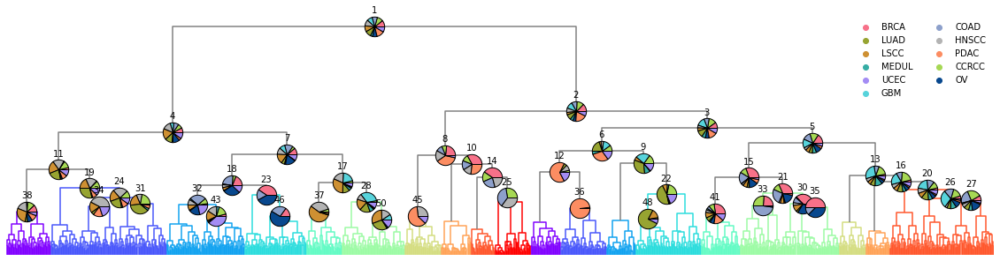

In [657]:
pl.plot_dendro_figure(corr_raw_mat, meta, pl.COLOR_SCHEME_NAME, groups_df)
plt.savefig(os.path.join(PLOTS_DIR, "dendro_full_cohort_pie.pdf"), dpi=200, bbox_inches='tight')

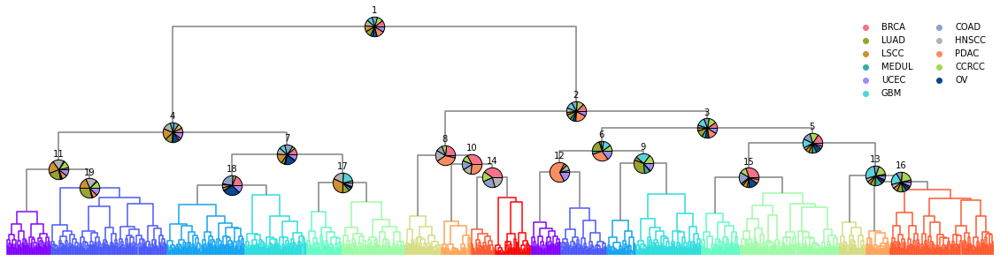

In [634]:
plot_dendro_figure(
    corr_raw_mat, 
    meta, 
    pl.COLOR_SCHEME_NAME, 
    groups_df.loc[:,groups_df.columns<20], 
    pie_label="id"
)

In [741]:
plot_dendro_figure(
    corr_raw_mat, 
    meta, 
    pl.COLOR_SCHEME_NAME, 
    groups_df.loc[:,groups_df.columns<20], 
    pie_label=dendro_group_names,
)
plt.savefig(os.path.join(PLOTS_DIR, "dendro_full_cohort_labels_pie.pdf"), dpi=200, bbox_inches='tight')

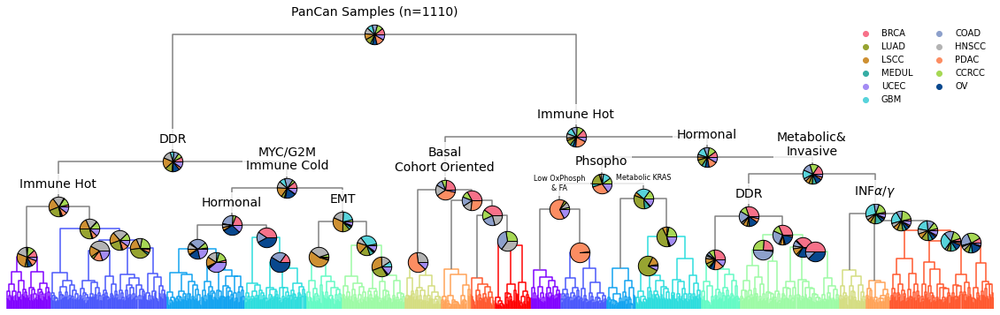

In [751]:
plot_dendro_figure(
    corr_raw_mat, 
    meta, 
    pl.COLOR_SCHEME_NAME, 
    groups_df, 
    pie_label=dendro_group_names
)
plt.savefig(os.path.join(PLOTS_DIR, "dendro_full_cohort_labels_full_pie.pdf"), dpi=200, bbox_inches='tight')

### Combined Figure

In [747]:
import importlib; importlib.reload(pl)

<module 'plotting' from '../../plotting.py'>

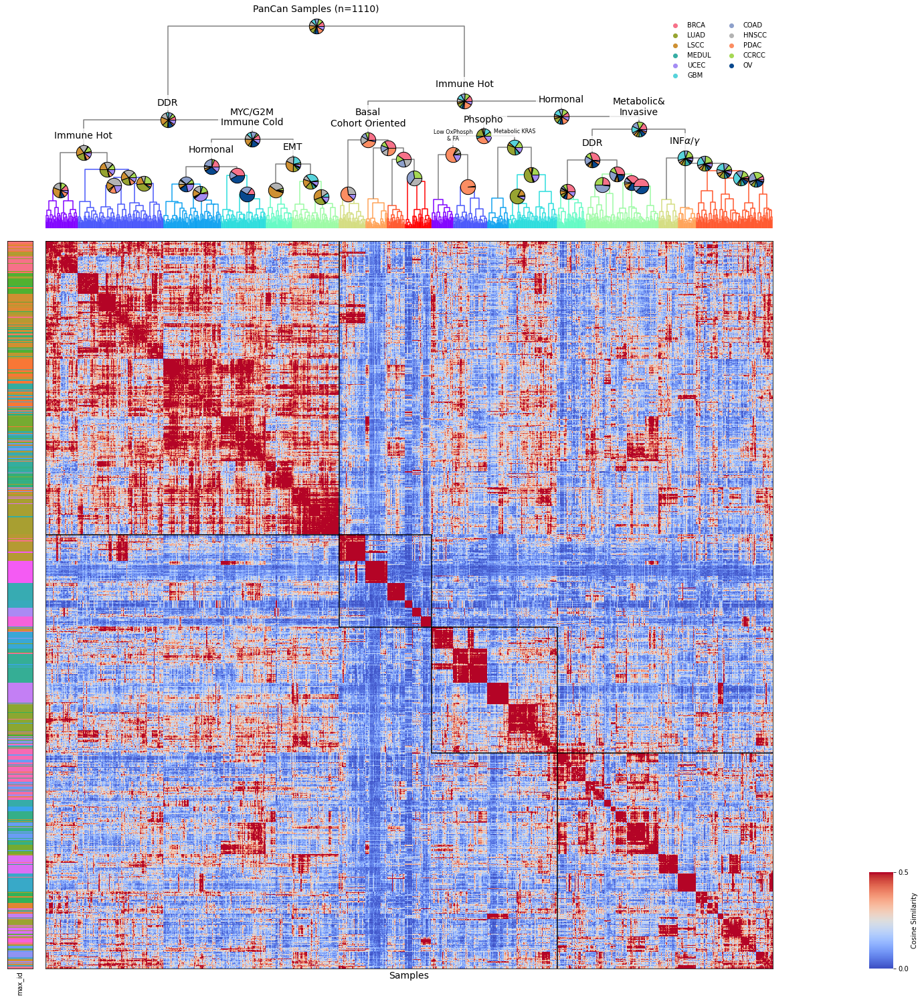

In [750]:
f,d,dres,d_linkage = pl.plot_cmatrix(
    corr_raw_mat, 
    n_clusters=N_CLUSTERS, 
    metas=[H.max_id],
    #vmin=-0.7,
    vmax=0.5,
    cbar_label='Cosine Similarity',
    metric='euclidean',
    method='ward',
    cmap='coolwarm',
    plot_cluster_lines=True,
    dendro_flag=True,
    dendro_meta=meta,
    dendro_cmap=pl.COLOR_SCHEME_NAME,
    dendro_groups_df=groups_df,
    dendro_pie_labels=dendro_group_names,
    figsize=(20,20)
)
plt.savefig(os.path.join(PLOTS_DIR, "Hmat_heatmap_w_dendro.pdf"), dpi=200, bbox_inches='tight')

In [760]:
de_df = pd.read_csv("diffexp/050721_imputed_res_reg_dendro/full_de_cohort_cov.tsv", sep='\t')
de_20_df = de_df[(de_df['feature']=='phosphoproteome') & (de_df['id']==20)]

In [768]:
map_df = pd.read_csv("data/050721/var_map_full.tsv", sep='\t', index_col=0)

In [776]:
de_20_df = de_20_df.set_index('index').drop(columns=['gene_name','id.description','variableSites','feature','accession_number']).join(map_df).iloc[:,1:]

In [784]:
pd.read_csv("diffexp/050721_imputed_res_reg_dendro/mappings.tsv", sep='\t').groupby('20').size()

20
False    34
True     83
dtype: int64

In [796]:
de_20_df[(de_20_df['adj.P.Val']<.05) & (de_20_df['logFC']<0.5)].shape

(11, 19)

In [798]:
de_20_df[(de_20_df['adj.P.Val']<.05) & (de_20_df['logFC']>0.5)].shape

(36, 19)

In [38]:
#de_20_df[de_20_df['adj.P.Val']<.1].sort_values('logFC', ascending=True).head(20)